In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns

# Load the dataset
df = pd.read_csv('/content/drive/MyDrive/3rd year/ML VAP /project dataset/heart_disease_uci2.csv')

In [ ]:
df.head()

,id,age,sex,dataset,cp,trestbps,chol,fbs,restecg,thalch,exang,oldpeak,slope,ca,thal,num
0,1,63,Male,Cleveland,typical angina,145.0,233.0,True,lv hypertrophy,150.0,False,2.3,downsloping,0.0,fixed defect,0
1,2,67,Male,Cleveland,asymptomatic,160.0,286.0,False,lv hypertrophy,108.0,True,1.5,flat,3.0,normal,2
2,3,67,Male,Cleveland,asymptomatic,120.0,229.0,False,lv hypertrophy,129.0,True,2.6,flat,2.0,reversable defect,1
3,4,37,Male,Cleveland,non-anginal,130.0,250.0,False,normal,187.0,False,3.5,downsloping,0.0,normal,0
4,5,41,Female,Cleveland,atypical angina,130.0,204.0,False,lv hypertrophy,172.0,False,1.4,upsloping,0.0,normal,0


In [ ]:
df.tail()

,id,age,sex,dataset,cp,trestbps,chol,fbs,restecg,thalch,exang,oldpeak,slope,ca,thal,num
915,916,54,Female,VA Long Beach,asymptomatic,127.0,333.0,True,st-t abnormality,154.0,False,0.0,NaN,NaN,NaN,1
916,917,62,Male,VA Long Beach,typical angina,NaN,139.0,False,st-t abnormality,NaN,NaN,NaN,NaN,NaN,NaN,0
917,918,55,Male,VA Long Beach,asymptomatic,122.0,223.0,True,st-t abnormality,100.0,False,0.0,NaN,NaN,fixed defect,2
918,919,58,Male,VA Long Beach,asymptomatic,NaN,385.0,True,lv hypertrophy,NaN,NaN,NaN,NaN,NaN,NaN,0
919,920,62,Male,VA Long Beach,atypical angina,120.0,254.0,False,lv hypertrophy,93.0,True,0.0,NaN,NaN,NaN,1


In [ ]:
df.shape

(920, 16)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 920 entries, 0 to 919
Data columns (total 16 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   id        920 non-null    int64  
 1   age       920 non-null    int64  
 2   sex       920 non-null    object 
 3   dataset   920 non-null    object 
 4   cp        920 non-null    object 
 5   trestbps  861 non-null    float64
 6   chol      890 non-null    float64
 7   fbs       830 non-null    object 
 8   restecg   918 non-null    object 
 9   thalch    865 non-null    float64
 10  exang     865 non-null    object 
 11  oldpeak   858 non-null    float64
 12  slope     611 non-null    object 
 13  ca        309 non-null    float64
 14  thal      434 non-null    object 
 15  num       920 non-null    int64  
dtypes: float64(5), int64(3), object(8)
memory usage: 115.1+ KB




---



---

**PREPROCESSING DATA**

IMPUTE MISSING VALUES

In [ ]:
df.isnull().values.any()

True

In [ ]:
df.isnull().sum()

id            0
age           0
sex           0
dataset       0
cp            0
trestbps     59
chol         30
fbs          90
restecg       2
thalch       55
exang        55
oldpeak      62
slope       309
ca          611
thal        486
num           0
dtype: int64

In [ ]:
# Impute missing values
# For numeric columns, methods like mean, median, or mode
df['trestbps'].fillna(df['trestbps'].median(), inplace=True)
df['chol'].fillna(df['chol'].median(), inplace=True)
df['thalch'].fillna(df['thalch'].mean(), inplace=True)
df['oldpeak'].fillna(df['oldpeak'].mean(), inplace=True)

# For categorical columns- mode
df['fbs'].fillna(df['fbs'].mode()[0], inplace=True)
df['restecg'].fillna(df['restecg'].mode()[0], inplace=True)
df['exang'].fillna(df['exang'].mode()[0], inplace=True)
df['slope'].fillna(df['slope'].mode()[0], inplace=True)
df['thal'].fillna(df['thal'].mode()[0], inplace=True)

df.drop(columns=['ca'], inplace=True)


In [ ]:
df.isnull().values.any()

False

OUTLIER FIXING

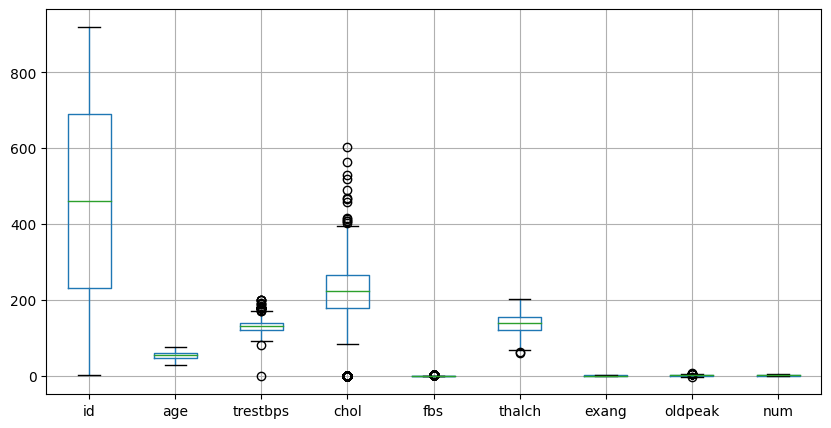

In [ ]:
# Detection of Outliers
df.boxplot(figsize=(10,5));

In [ ]:
# Calculate the IQR for 'chol' and 'trestbp'
Q1_chol = df['chol'].quantile(0.25)
Q3_chol = df['chol'].quantile(0.75)
IQR_chol = Q3_chol - Q1_chol

Q1_trestbp = df['trestbps'].quantile(0.25)
Q3_trestbp = df['trestbps'].quantile(0.75)
IQR_trestbp = Q3_trestbp - Q1_trestbp

# Calculate the upper bound for outliers
upper_bound_chol = Q3_chol + 1.5 * IQR_chol
upper_bound_trestbp = Q3_trestbp + 1.5 * IQR_trestbp

# Cap outliers by replacing them with the upper bound
df['chol'] = df['chol'].apply(lambda x: upper_bound_chol if x > upper_bound_chol else x)
df['trestbps'] = df['trestbps'].apply(lambda x: upper_bound_trestbp if x > upper_bound_trestbp else x)


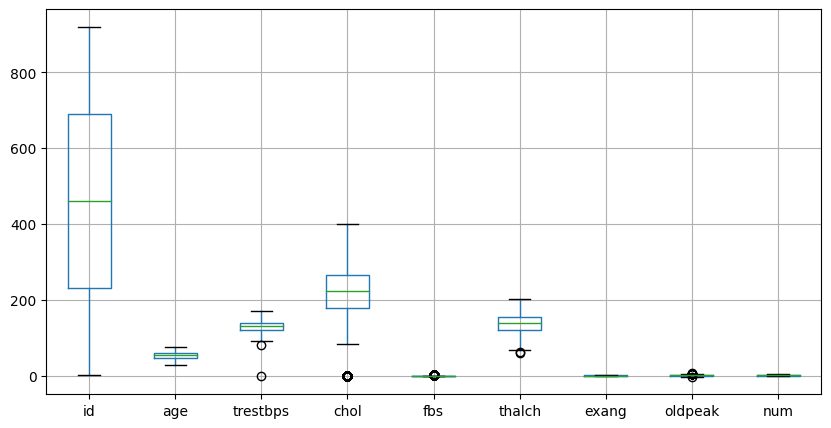

In [ ]:
# modified Outliers
df.boxplot(figsize=(10,5));

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 920 entries, 0 to 919
Data columns (total 15 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   id        920 non-null    int64  
 1   age       920 non-null    int64  
 2   sex       920 non-null    object 
 3   dataset   920 non-null    object 
 4   cp        920 non-null    object 
 5   trestbps  920 non-null    float64
 6   chol      920 non-null    float64
 7   fbs       920 non-null    bool   
 8   restecg   920 non-null    object 
 9   thalch    920 non-null    float64
 10  exang     920 non-null    bool   
 11  oldpeak   920 non-null    float64
 12  slope     920 non-null    object 
 13  thal      920 non-null    object 
 14  num       920 non-null    int64  
dtypes: bool(2), float64(4), int64(3), object(6)
memory usage: 95.4+ KB


Feature ENCODING

In [ ]:

from sklearn.preprocessing import LabelEncoder

columns_to_encode = ['sex','dataset','fbs','cp','restecg','exang','slope','thal']

label_encoder = LabelEncoder()

for column in columns_to_encode:
    df[column] = label_encoder.fit_transform(df[column])
df

,id,age,sex,dataset,cp,trestbps,chol,fbs,restecg,thalch,exang,oldpeak,slope,thal,num
0,1,63,1,0,3,145.0,233.0,1,0,150.000000,0,2.300000,0,0,0
1,2,67,1,0,0,160.0,286.0,0,0,108.000000,1,1.500000,1,1,2
2,3,67,1,0,0,120.0,229.0,0,0,129.000000,1,2.600000,1,2,1
3,4,37,1,0,2,130.0,250.0,0,1,187.000000,0,3.500000,0,1,0
4,5,41,0,0,1,130.0,204.0,0,0,172.000000,0,1.400000,2,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
915,916,54,0,3,0,127.0,333.0,1,2,154.000000,0,0.000000,1,1,1
916,917,62,1,3,3,130.0,139.0,0,2,137.545665,0,0.878788,1,1,0
917,918,55,1,3,0,122.0,223.0,1,2,100.000000,0,0.000000,1,0,2
918,919,58,1,3,0,130.0,385.0,1,0,137.545665,0,0.878788,1,1,0


In [ ]:
# Dropping 'id' from the dataframe
df.drop('id', axis=1, inplace=True)
df

,age,sex,dataset,cp,trestbps,chol,fbs,restecg,thalch,exang,oldpeak,slope,thal,num
0,63,1,0,3,145.0,233.0,1,0,150.000000,0,2.300000,0,0,0
1,67,1,0,0,160.0,286.0,0,0,108.000000,1,1.500000,1,1,2
2,67,1,0,0,120.0,229.0,0,0,129.000000,1,2.600000,1,2,1
3,37,1,0,2,130.0,250.0,0,1,187.000000,0,3.500000,0,1,0
4,41,0,0,1,130.0,204.0,0,0,172.000000,0,1.400000,2,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
915,54,0,3,0,127.0,333.0,1,2,154.000000,0,0.000000,1,1,1
916,62,1,3,3,130.0,139.0,0,2,137.545665,0,0.878788,1,1,0
917,55,1,3,0,122.0,223.0,1,2,100.000000,0,0.000000,1,0,2
918,58,1,3,0,130.0,385.0,1,0,137.545665,0,0.878788,1,1,0


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 920 entries, 0 to 919
Data columns (total 14 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   age       920 non-null    int64  
 1   sex       920 non-null    int64  
 2   dataset   920 non-null    int64  
 3   cp        920 non-null    int64  
 4   trestbps  920 non-null    float64
 5   chol      920 non-null    float64
 6   fbs       920 non-null    int64  
 7   restecg   920 non-null    int64  
 8   thalch    920 non-null    float64
 9   exang     920 non-null    int64  
 10  oldpeak   920 non-null    float64
 11  slope     920 non-null    int64  
 12  thal      920 non-null    int64  
 13  num       920 non-null    int64  
dtypes: float64(4), int64(10)
memory usage: 100.8 KB


In [ ]:

X = df.drop(['num'], axis=1)
Y = df['num']

print(X.head())
print("Shape of X:", X.shape)
print("Shape of Y:", Y.shape)


   age  sex  dataset  cp  trestbps   chol  fbs  restecg  thalch  exang  \
0   63    1        0   3     145.0  233.0    1        0   150.0      0   
1   67    1        0   0     160.0  286.0    0        0   108.0      1   
2   67    1        0   0     120.0  229.0    0        0   129.0      1   
3   37    1        0   2     130.0  250.0    0        1   187.0      0   
4   41    0        0   1     130.0  204.0    0        0   172.0      0   

   oldpeak  slope  thal  
0      2.3      0     0  
1      1.5      1     1  
2      2.6      1     2  
3      3.5      0     1  
4      1.4      2     1  
Shape of X: (920, 13)
Shape of Y: (920,)


SCALING THE DATA

In [ ]:
# Scaling the data
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
X_scaled

array([[ 1.00738556,  0.51693097, -1.09555752, ...,  1.34942143,
        -2.23408054, -2.39781342],
       [ 1.43203377,  0.51693097, -1.09555752, ...,  0.58983239,
        -0.29506724, -0.32840597],
       [ 1.43203377,  0.51693097, -1.09555752, ...,  1.63426731,
        -0.29506724,  1.74100149],
       ...,
       [ 0.15808914,  0.51693097,  1.55917361, ..., -0.83439704,
        -0.29506724, -2.39781342],
       [ 0.4765753 ,  0.51693097,  1.55917361, ...,  0.        ,
        -0.29506724, -0.32840597],
       [ 0.90122351,  0.51693097,  1.55917361, ..., -0.83439704,
        -0.29506724, -0.32840597]])

In [ ]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
# transform data
scaled = scaler.fit_transform(X)
scaled


array([[0.71428571, 1.        , 0.        , ..., 0.55681818, 0.        ,
        0.        ],
       [0.79591837, 1.        , 0.        , ..., 0.46590909, 0.5       ,
        0.5       ],
       [0.79591837, 1.        , 0.        , ..., 0.59090909, 0.5       ,
        1.        ],
       ...,
       [0.55102041, 1.        , 1.        , ..., 0.29545455, 0.5       ,
        0.        ],
       [0.6122449 , 1.        , 1.        , ..., 0.3953168 , 0.5       ,
        0.5       ],
       [0.69387755, 1.        , 1.        , ..., 0.29545455, 0.5       ,
        0.5       ]])

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 920 entries, 0 to 919
Data columns (total 14 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   age       920 non-null    int64  
 1   sex       920 non-null    int64  
 2   dataset   920 non-null    int64  
 3   cp        920 non-null    int64  
 4   trestbps  920 non-null    float64
 5   chol      920 non-null    float64
 6   fbs       920 non-null    int64  
 7   restecg   920 non-null    int64  
 8   thalch    920 non-null    float64
 9   exang     920 non-null    int64  
 10  oldpeak   920 non-null    float64
 11  slope     920 non-null    int64  
 12  thal      920 non-null    int64  
 13  num       920 non-null    int64  
dtypes: float64(4), int64(10)
memory usage: 100.8 KB


TRAIN TEST SPLIT

In [ ]:
from sklearn.model_selection import train_test_split
X_train,X_test,Y_train,Y_test=train_test_split(X,Y,test_size=0.20,random_state=100)
from sklearn.metrics import confusion_matrix,accuracy_score,precision_score,classification_report,recall_score,f1_score

In [ ]:
X.head()

,age,sex,dataset,cp,trestbps,chol,fbs,restecg,thalch,exang,oldpeak,slope,thal
0,63,1,0,3,145.0,233.0,1,0,150.0,0,2.3,0,0
1,67,1,0,0,160.0,286.0,0,0,108.0,1,1.5,1,1
2,67,1,0,0,120.0,229.0,0,0,129.0,1,2.6,1,2
3,37,1,0,2,130.0,250.0,0,1,187.0,0,3.5,0,1
4,41,0,0,1,130.0,204.0,0,0,172.0,0,1.4,2,1




---



---


**SINGLE CLASSIFIERS**





* LOGISTIC REGRESSION
* KNN
* DECISION TREE
* SVM




---




LOGISTIC REGRESSION

In [ ]:
from sklearn.linear_model import LogisticRegression
lr = LogisticRegression(max_iter=5000)  # Try a different solver

lr.fit(X_train, Y_train)
Y_pred_lr=lr.predict(X_test)

# Calculate metrics
from sklearn.metrics import precision_score

# Calculate metrics
print(confusion_matrix(Y_test,Y_pred_lr))
accuracy = accuracy_score(Y_test, Y_pred_lr)
precision = precision_score(Y_test, Y_pred_lr, average='weighted', zero_division=0)
recall = recall_score(Y_test, Y_pred_lr,average='macro')
f1 = f1_score(Y_test, Y_pred_lr,average='macro')

print("Logistic Regression Metrics:")
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)

[[76  7  1  0  0]
 [24 29  1  5  0]
 [ 6  9  1  5  0]
 [ 3  9  2  3  0]
 [ 1  2  0  0  0]]
Logistic Regression Metrics:
Accuracy: 0.592391304347826
Precision: 0.5256141955870217
Recall: 0.324075392869012
F1 Score: 0.31295521152984174


KNN

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
knn=KNeighborsClassifier(n_neighbors=7)
knn.fit(X_train,Y_train)
Y_pred_knn =knn.predict(X_test)
from sklearn.metrics import confusion_matrix,accuracy_score,precision_score,recall_score,f1_score
print(confusion_matrix(Y_test,Y_pred_knn))
print('Accuracy:',accuracy_score(Y_test,Y_pred_knn))
print('Precision:',precision_score(Y_test,Y_pred_knn,average='weighted',zero_division=0))
print('Recall:',recall_score(Y_test,Y_pred_knn,average='weighted'))
print('f1score:',f1_score(Y_test,Y_pred_knn,average='weighted'))



[[62 20  1  1  0]
 [33 20  4  2  0]
 [ 6 11  1  3  0]
 [ 7  3  2  5  0]
 [ 1  2  0  0  0]]
Accuracy: 0.4782608695652174
Precision: 0.43045390115468896
Recall: 0.4782608695652174
f1score: 0.4457084537012541


DECISION TREE

In [ ]:
from sklearn.tree import DecisionTreeClassifier
dtree=DecisionTreeClassifier()
dtree.fit(X_train,Y_train)
Y_pred_dtree =dtree.predict(X_test)
from sklearn.metrics import confusion_matrix,accuracy_score,precision_score,recall_score,f1_score
print(confusion_matrix(Y_test,Y_pred_dtree))
print('Accuracy:',accuracy_score(Y_test,Y_pred_dtree))
print('Precision:',precision_score(Y_test,Y_pred_dtree,average='weighted',zero_division=0))
print('Recall:',recall_score(Y_test,Y_pred_dtree,average='weighted'))
print('f1score:',f1_score(Y_test,Y_pred_dtree,average='weighted'))


[[67  9  2  5  1]
 [22 15 11  9  2]
 [ 4  5  7  4  1]
 [ 2  0  9  6  0]
 [ 1  1  1  0  0]]
Accuracy: 0.5163043478260869
Precision: 0.5286684782608696
Recall: 0.5163043478260869
f1score: 0.5063113555501196


In [ ]:
class_names = df['num'].unique()
print(class_names)

[0 2 1 3 4]


In [ ]:
#Visualising DT
import matplotlib.pyplot as plt
from sklearn.tree import plot_tree
fn=list(X_train)
# Define class names
class_names = ['0', '1','2','3','4']

# Plot decision tree
plt.figure(figsize=(4, 4), dpi=5000)
plot_tree(dtree, feature_names=fn, class_names=class_names, filled=True)
plt.show()

In [ ]:
from sklearn.tree import DecisionTreeClassifier
dtree=DecisionTreeClassifier(criterion='entropy')
dtree.fit(X_train,Y_train)
Y_pred_dtree =dtree.predict(X_test)
from sklearn.metrics import confusion_matrix,accuracy_score,precision_score,recall_score,f1_score
print(confusion_matrix(Y_test,Y_pred_dtree))
print('Accuracy:',accuracy_score(Y_test,Y_pred_dtree))
print('Precision:',precision_score(Y_test,Y_pred_dtree,average='weighted'))
print('Recall:',recall_score(Y_test,Y_pred_dtree,average='weighted'))
print('f1score:',f1_score(Y_test,Y_pred_dtree,average='weighted'))

[[63 10  4  6  1]
 [22 21 10  5  1]
 [ 2  4  9  6  0]
 [ 3  2  7  5  0]
 [ 0  1  0  1  1]]
Accuracy: 0.5380434782608695
Precision: 0.5565267137598249
Recall: 0.5380434782608695
f1score: 0.5382377318769359




SVM


In [ ]:
from sklearn import svm
clf=svm.SVC(kernel='linear',C=3)
clf.fit(X_train,Y_train)
Y_pred_svm =clf.predict(X_test)
from sklearn.metrics import confusion_matrix,accuracy_score,precision_score,f1_score,recall_score
print(confusion_matrix(Y_test,Y_pred_svm))
print('Accuracy:',accuracy_score(Y_test,Y_pred_svm))
print('Precision:',precision_score(Y_test,Y_pred_svm,average='weighted'))
print('Recall:',recall_score(Y_test,Y_pred_svm,average='weighted'))
print('f1score:',f1_score(Y_test,Y_pred_svm,average='weighted'))



---



---

**ENSEMBEL MODELS**


* BAGGING  
* BOOSTING






---









1. BAGGING




RANDOM FOREST ALGORITHM

In [ ]:
from sklearn.ensemble import RandomForestClassifier
rf_classifier=RandomForestClassifier(n_estimators=10)
rf_classifier.fit(X_train,Y_train)
Y_pred_rf =rf_classifier.predict(X_test)
from sklearn.metrics import confusion_matrix,accuracy_score,precision_score,f1_score,recall_score
print(confusion_matrix(Y_test,Y_pred_rf))
print('Accuracy:',accuracy_score(Y_test,Y_pred_rf))
print('Precision:',precision_score(Y_test,Y_pred_rf,average='weighted'))
print('Recall:',recall_score(Y_test,Y_pred_rf,average='weighted'))
print('f1score:',f1_score(Y_test,Y_pred_rf,average='weighted'))

2.BOOSTING



*Gradient boosting*

*ADA boosting*

*XtremeGradientT(xgb) boosting*

*CAT boosting*


GRADIENT BOOST

In [ ]:
#Gradient boost
from sklearn.ensemble import GradientBoostingClassifier
gradient_booster=GradientBoostingClassifier(learning_rate=0.1)
gradient_booster.fit(X_train,Y_train)
Y_pred_gradboost =gradient_booster.predict(X_test)
from sklearn.metrics import confusion_matrix,accuracy_score,precision_score,f1_score,recall_score
print(confusion_matrix(Y_test,Y_pred_gradboost))
print('Accuracy:',accuracy_score(Y_test,Y_pred_gradboost))
print('Precision:',precision_score(Y_test,Y_pred_gradboost,average='weighted'))
print('Recall:',recall_score(Y_test,Y_pred_gradboost,average='weighted'))
print('f1score:',f1_score(Y_test,Y_pred_gradboost,average='weighted'))

ADA BOOST

In [ ]:
#ADA Boost
from sklearn.ensemble import AdaBoostClassifier
ADA_booster=AdaBoostClassifier()
ADA_booster.fit(X_train,Y_train)
Y_pred_ADA =ADA_booster.predict(X_test)
from sklearn.metrics import confusion_matrix,accuracy_score,precision_score,f1_score,recall_score
print(confusion_matrix(Y_test,Y_pred_ADA))
print('Accuracy:',accuracy_score(Y_test,Y_pred_ADA))
print('Precision:',precision_score(Y_test,Y_pred_ADA,average='weighted'))
print('Recall:',recall_score(Y_test,Y_pred_ADA,average='weighted'))
print('f1score:',f1_score(Y_test,Y_pred_ADA,average='weighted'))

XGB BOOST

In [ ]:
pip install xgboost

In [ ]:
#xgboost
from xgboost import XGBClassifier
xgb=XGBClassifier(learning_rate=0.1)
xgb.fit(X_train,Y_train)
Y_pred_xgb =xgb.predict(X_test)
from sklearn.metrics import confusion_matrix,accuracy_score,precision_score,f1_score,recall_score
print(confusion_matrix(Y_test,Y_pred_xgb))
print('Accuracy:',accuracy_score(Y_test,Y_pred_xgb))
print('Precision:',precision_score(Y_test,Y_pred_xgb,average='weighted'))
print('Recall:',recall_score(Y_test,Y_pred_xgb,average='weighted'))
print('f1score:',f1_score(Y_test,Y_pred_xgb,average='weighted'))

CAT BOOST

In [ ]:
pip install catboost

In [ ]:
#catboost
from catboost import CatBoostClassifier
cat=CatBoostClassifier()
cat.fit(X_train,Y_train)
Y_pred_cat=cat.predict(X_test)
from sklearn.metrics import confusion_matrix,accuracy_score,precision_score,f1_score,recall_score
print(confusion_matrix(Y_test,Y_pred_cat))
print('Accuracy:',accuracy_score(Y_test,Y_pred_cat))
print('Precision:',precision_score(Y_test,Y_pred_cat,average='weighted'))
print('Recall:',recall_score(Y_test,Y_pred_cat,average='weighted'))
print('f1score:',f1_score(Y_test,Y_pred_cat,average='weighted'))

In [ ]:
#for ensemble
print("Shape of Y_pred_lr:", Y_pred_lr.shape)
print("Shape of Y_pred_knn:", Y_pred_knn.shape)
print("Shape of Y_pred_dtree:", Y_pred_dtree.shape)
print("Shape of Y_pred_svm:", Y_pred_svm.shape)
print("Shape of Y_pred_rf:", Y_pred_rf.shape)
print("Shape of Y_pred_gradboost:", Y_pred_gradboost.shape)
print("Shape of Y_pred_ADA:", Y_pred_ADA.shape)
print("Shape of Y_pred_xgb:", Y_pred_xgb.shape)
Y_pred_cat = np.squeeze(Y_pred_cat)
print("Shape of Y_pred_cat:", Y_pred_cat.shape)

**3.**BAGGING (Ensemble)

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, classification_report

# Transpose predictions
X1 = np.array([Y_pred_lr, Y_pred_knn,Y_pred_dtree,Y_pred_svm]).T

# Initialize meta-learner
model = RandomForestClassifier()

# Fit meta-learner
model.fit(X1, Y_test)

# Predict with meta-learner
ensemble_predictions = model.predict(X1)
from sklearn.metrics import confusion_matrix,accuracy_score,precision_score,f1_score,recall_score
print(confusion_matrix(Y_test,ensemble_predictions))
print('Accuracy:',accuracy_score(Y_test,ensemble_predictions))
print('Precision:',precision_score(Y_test,ensemble_predictions,average='weighted'))
print('Recall:',recall_score(Y_test,ensemble_predictions,average='weighted'))
print('f1score:',f1_score(Y_test,ensemble_predictions,average='weighted'))


In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, classification_report

# Transpose predictions
X1 = np.array([Y_pred_rf, Y_pred_gradboost,Y_pred_ADA,Y_pred_xgb,Y_pred_cat]).T

# Initialize meta-learner
model = RandomForestClassifier()

# Fit meta-learner
model.fit(X1, Y_test)

# Predict with meta-learner
ensemble_predictions = model.predict(X1)
from sklearn.metrics import confusion_matrix,accuracy_score,precision_score,f1_score,recall_score
print(confusion_matrix(Y_test,ensemble_predictions))
print('Accuracy:',accuracy_score(Y_test,ensemble_predictions))
print('Precision:',precision_score(Y_test,ensemble_predictions,average='weighted'))
print('Recall:',recall_score(Y_test,ensemble_predictions,average='weighted'))
print('f1score:',f1_score(Y_test,ensemble_predictions,average='weighted'))


In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, classification_report

# Transpose predictions
X1 = np.column_stack([Y_pred_lr, Y_pred_knn,Y_pred_dtree,Y_pred_svm,Y_pred_rf,Y_pred_ADA,Y_pred_xgb])

# Initialize meta-learner
model = RandomForestClassifier()

# Fit meta-learner
model.fit(X1, Y_test)

# Predict with meta-learner
ensemble_predictions = model.predict(X1)
from sklearn.metrics import confusion_matrix,accuracy_score,precision_score,f1_score,recall_score
print(confusion_matrix(Y_test,ensemble_predictions))
print('Accuracy:',accuracy_score(Y_test,ensemble_predictions))
print('Precision:',precision_score(Y_test,ensemble_predictions,average='weighted'))
print('Recall:',recall_score(Y_test,ensemble_predictions,average='weighted'))
print('f1score:',f1_score(Y_test,ensemble_predictions,average='weighted'))


[[81  3  0  0  0]
 [12 47  0  0  0]
 [ 1  2 18  0  0]
 [ 0  0  0 17  0]
 [ 0  0  0  0  3]]
Accuracy: 0.9021739130434783
Precision: 0.9060320750017788
Recall: 0.9021739130434783
f1score: 0.9010761823414485




---



---


**HYPERPARAMETER TUNING**


---

Manual

Randomized

Grid


MANUAL

In [ ]:
#Manual Hyperparameter Tuning
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, classification_report

from sklearn.model_selection import train_test_split
#X_train,X_test,Y_train,Y_test=train_test_split(X,Y,test_size=0.20,random_state=100)
from sklearn.ensemble import RandomForestClassifier
rf_classifier=RandomForestClassifier(n_estimators=100,max_depth=7,criterion='gini',min_samples_split=2, min_samples_leaf=1, max_features='auto',random_state=50)
rf_classifier.fit(X_train,Y_train)
prediction=rf_classifier.predict(X_test)

from sklearn.metrics import confusion_matrix,accuracy_score,precision_score,classification_report,recall_score
print(confusion_matrix(Y_test,prediction))
print('Accuracy',accuracy_score(Y_test,prediction))

print(classification_report(Y_test,prediction))




/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[[75  8  1  0  0]
 [19 32  4  4  0]
 [ 5  9  3  4  0]
 [ 2  7  2  6  0]
 [ 1  1  0  1  0]]
Accuracy 0.6304347826086957
              precision    recall  f1-score   support

           0       0.74      0.89      0.81        84
           1       0.56      0.54      0.55        59
           2       0.30      0.14      0.19        21
           3       0.40      0.35      0.38        17
           4       0.00      0.00      0.00         3

    accuracy                           0.63       184
   macro avg       0.40      0.39      0.39       184
weighted avg       0.59      0.63      0.60       184



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
import numpy as np
from sklearn.model_selection import RandomizedSearchCV

#n_estimators=[int(x) for x in np.linspace(start=0,stop=2000,num=10)]
n_estimators=[5,7,20,55,70,100,200,300,400,550,750,850,1000,1500,2000]
max_features=['auto','sqrt','log2']
#max_depth=[int(x) for x in np.linspace(7,2000,10)]
max_depth=[3,7,10,30,40,50,70,80,100,200]
min_samples_split=[2,5,10,14]
min_samples_leaf=[1,2,4,6,8]
#create random grid
random_grid={'n_estimators':n_estimators,'max_features':max_features,'max_depth':max_depth,'min_samples_split':min_samples_split,
             'min_samples_leaf':min_samples_leaf,'criterion':['gini','entropy']}
print(random_grid)
rf=RandomForestClassifier()
rf_randomcv=RandomizedSearchCV(estimator=rf,param_distributions=random_grid,n_iter=100,cv=3,verbose=2,random_state=100,n_jobs=2)
rf_randomcv.fit(X_train,Y_train)


In [ ]:
rf=RandomForestClassifier()
rf_randomcv=RandomizedSearchCV(estimator=rf,param_distributions=random_grid,n_iter=100,cv=3,verbose=2,random_state=100,n_jobs=1)
rf_randomcv.fit(X_train,Y_train)

In [ ]:
rf_randomcv.best_params_

In [ ]:
best_random_grid=rf_randomcv.best_estimator_
from sklearn.metrics import accuracy_score
Y_pred=best_random_grid.predict(X_test)
print('Accuracy:',accuracy_score(Y_test,Y_pred))

from sklearn.metrics import confusion_matrix,accuracy_score,precision_score,classification_report,recall_score,f1_score
print(confusion_matrix(Y_test,Y_pred))
print('Accuracy:',accuracy_score(Y_test,Y_pred))
print(classification_report(Y_test,Y_pred))

GridSearchCv

In [ ]:
from sklearn.model_selection import GridSearchCV
param_grid={
    'criterion':[rf_randomcv.best_params_['criterion']],
    'max_depth':[rf_randomcv.best_params_['max_depth']],
        'min_samples_leaf':[rf_randomcv.best_params_['min_samples_leaf'],
        rf_randomcv.best_params_['min_samples_leaf']+2,
        rf_randomcv.best_params_['min_samples_leaf']+4],
     'min_samples_split':[rf_randomcv.best_params_['min_samples_split']-2,
     rf_randomcv.best_params_['min_samples_split']-1,
    rf_randomcv.best_params_['min_samples_split'],
     rf_randomcv.best_params_['min_samples_split']+1,
    rf_randomcv.best_params_['min_samples_split']+2],
      'n_estimators':[rf_randomcv.best_params_['n_estimators']-200,
     rf_randomcv.best_params_['n_estimators']-100,
    rf_randomcv.best_params_['n_estimators'],
     rf_randomcv.best_params_['n_estimators']+100,
    rf_randomcv.best_params_['n_estimators']+200],

}
print(param_grid)

In [ ]:
rf=RandomForestClassifier()
grid_search=GridSearchCV(estimator=rf,param_grid=param_grid,cv=5,verbose=2,n_jobs=2)
grid_search.fit(X_train,Y_train)

In [ ]:
grid_search.best_estimator_

In [ ]:
best_grid=grid_search.best_estimator_

In [ ]:
best_grid

In [ ]:
best_grid_search=grid_search.best_estimator_
from sklearn.metrics import accuracy_score
Y_pred=best_grid_search.predict(X_test)
print('Accuracy:',accuracy_score(Y_test,Y_pred))


**HYPERparameter TUNED MODEL**

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, classification_report

# Transpose predictions
X1 = np.array([Y_pred_lr, Y_pred_knn,Y_pred_dtree,Y_pred_svm,Y_pred_rf,Y_pred_ADA,Y_pred_xgb]).T

# Initialize meta-learner
model = RandomForestClassifier(n_estimators=850,max_depth=7,criterion='entropy',min_samples_split=2, min_samples_leaf=1, max_features='auto',random_state=7)

# Fit meta-learner
model.fit(X1, Y_test)

# Predict with meta-learner
ensemble_predictions = model.predict(X1)
from sklearn.metrics import confusion_matrix,accuracy_score,precision_score,f1_score,recall_score
print(confusion_matrix(Y_test,ensemble_predictions))
print('Accuracy:',accuracy_score(Y_test,ensemble_predictions))
print('Precision:',precision_score(Y_test,ensemble_predictions,average='weighted'))
print('Recall:',recall_score(Y_test,ensemble_predictions,average='weighted'))
print('f1score:',f1_score(Y_test,ensemble_predictions,average='weighted'))

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[[81  3  0  0  0]
 [12 47  0  0  0]
 [ 1  2 18  0  0]
 [ 0  0  0 17  0]
 [ 0  0  0  0  3]]
Accuracy: 0.9021739130434783
Precision: 0.9060320750017788
Recall: 0.9021739130434783
f1score: 0.9010761823414485


In [ ]:
X1

In [ ]:
X.head()



---






---




**LIME AND SHAP**

.



.



(Local Interpretable Model-agnostic Explanations)LIME for the Tabulated Data

In [ ]:
!pip install lime
import lime
import lime.lime_tabular

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 4.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283835 sha256=f25d354bac1d4667aee9c11d35702eab1997b7bda323ce06d75dd5ab691719b7
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


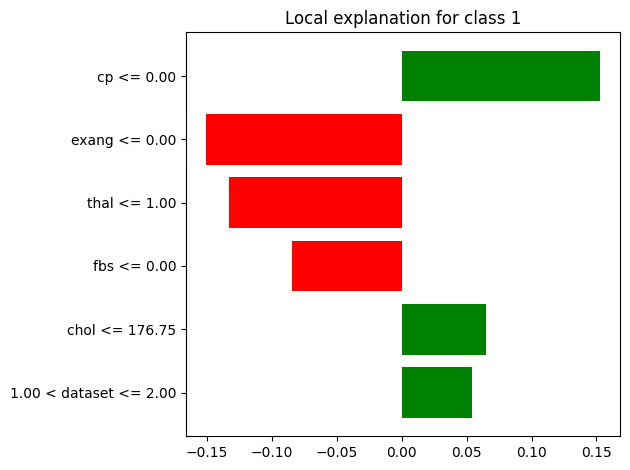

In [ ]:
from lime.lime_tabular import LimeTabularExplainer

explainer = LimeTabularExplainer(X_train.values,feature_names=X_train.columns.values.tolist(),class_names=['0','1','2','3','4'],mode='classification')
# Now explain a prediction
exp = explainer.explain_instance(X_train.values[57], xgb.predict_proba,num_features=6)

# Generate the explanation plot
fig = exp.as_pyplot_figure()
plt.tight_layout()
plt.show()


In [ ]:
exp.show_in_notebook(show_table=True)

SHAP (SHapley Additive exPlanations.)

In [ ]:
pip install shapash

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 651.7/651.7 kB 5.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 535.7/535.7 kB 9.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.2/10.2 MB 22.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 221.2/221.2 kB 19.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 642.7/642.7 kB 29.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 34.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.9/81.9 kB 6.6 MB/s eta 0:00:00
  Created wheel for dash-renderer: filename=dash_renderer-1.8.3-py3-none-any.whl size=1013921 sha256=12887c7eabca83af6837071c60d7f3420b0ac81eddd9f98a77ab71adfb9b7284
  Stored in directory: /root/.cache/pip/wheels/6c/04/c8/22a0b5a26c3ecb61e17a27d4bbe7fad32d1417bbdbd4d46acf
  Created wheel for dash-daq: filename=dash_daq-0.5.0-py3-none-any.whl size

In [ ]:
X= pd.DataFrame(X)
fi=pd.DataFrame({'Feature': X1.columns, 'Importance': model.feature_importances_})
fi.sort_values(by='Importance',ascending=False,ignore_index=True)


NameError: name 'pd' is not defined

In [ ]:
from shapash.explainer.smart_explainer import SmartExplainer
xpl = SmartExplainer(model)
xpl.compile(x=X)
xpl.plot.features_importance()


INFO: Shap explainer type - <shap.explainers._tree.TreeExplainer object at 0x7a1fa0eaead0>


In [ ]:
import random
subset = random.choices(X.index, k =50)
xpl.plot.features_importance(selection=subset)

In [ ]:
xpl.plot.contribution_plot(0)